In [10]:
using PerlaTonettiWaugh, Plots

┌ Info: Recompiling stale cache file C:\Users\Chiyoung Ahn\.julia\compiled\v1.0\Plots\ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


┌ Info: Recompiling stale cache file C:\Users\Chiyoung Ahn\.julia\compiled\v1.0\GR\NDU5Y.ji for GR [28b8d3ca-fb5f-59d9-8090-bfdbd6d07a71]
└ @ Base loading.jl:1184


In [2]:
# State grid. 
z_min = 0.0 
z_max = 5.0
M = 1000
z_grid = range(z_min, stop = z_max, length = M) # Since we only care about the grid. 

# Define common objects. 
d_0 = 5
d_T = 2.3701
params = (ρ = 0.02, σ = 4.2508, N = 10, θ = 5.1269, γ = 1.01, κ = 0.013, ζ = 1, η = 0, Theta = 1, χ = 1/(2.1868), υ = 0.0593, μ = 0, δ = 0.053) # Baselines per Jesse. 
σ = params.σ
δ = params.δ

0.053

First, compute the stationary solutions at t = 0 and t = T.

In [3]:
# Compute the stationary solution at t = 0 and t = T first
params_0 = merge(params, (d = d_0,)) # parameters to be used at t = 0
params_T = merge(params, (d = d_T,)) # parameters to be used at t = T

stationary_sol_0 = stationary_numerical(params_0, z_grid) # solution at t = 0
Ω_0 = stationary_sol_0.Ω

stationary_sol_T = stationary_numerical(params_T, z_grid) # solution at t = T
v_T = stationary_sol_T.v_tilde
g_T = stationary_sol_T.g
z_hat_T = stationary_sol_T.z_hat
Ω_T = stationary_sol_T.Ω

T = (log(Ω_0) - log(Ω_T)) / δ
settings = (z = z_grid, tstops = 0:1e-2:T, Δ_E = 1e-03)

(z = 0.0:0.005005005005005005:5.0, tstops = 0.0:0.01:8.51, Δ_E = 0.001)

Define `Ω_vec` (for interpolation) as follows; note that `Ω`, which `Ω_vec` is based on, might not be in the equilibrium we are looking for.

In [4]:
Ω(t) = t < T ? Ω_0 * exp(-δ*t) : Ω_T # default option for Ω (not in equilibrium)
Ω_nodes = 0:1e-2:T
Ω_vec = map(t -> Ω(t), Ω_nodes)
entry_residual_nodes = 1e-2:1e-2:(T-1e-2)

0.01:0.01:8.5

In [12]:
# Solve and compute residuals
entry_residuals_tuple = entry_residuals(params_T, stationary_sol_T, settings, Ω_vec, Ω_nodes, entry_residual_nodes)

(entry_residuals_interpolation = QuantEcon.LinInterp{Array{Float64,1},StepRangeLen{Float64,Base.TwicePrecision{Float64},Base.TwicePrecision{Float64}}}(0.01:0.01:8.5, [2.02327e-11, 7.1176e-8, 1.42332e-7, 2.84643e-7, 5.69244e-7, 1.13839e-6, 2.27642e-6, 4.55153e-6, 9.34242e-6, 1.41292e-5  …  -0.0290187, -0.0291241, -0.0292295, -0.0293351, -0.0294408, -0.0295466, -0.0296524, -0.0297584, -0.0298645, -0.0299707], 850, 1), entry_residuals = [2.02327e-11, 7.1176e-8, 1.42332e-7, 2.84643e-7, 5.69244e-7, 1.13839e-6, 2.27642e-6, 4.55153e-6, 9.34242e-6, 1.41292e-5  …  -0.0290187, -0.0291241, -0.0292295, -0.0293351, -0.0294408, -0.0295466, -0.0296524, -0.0297584, -0.0298645, -0.0299707], solved_dynamics = (v = Array{Float64,1}[[1.1868, 1.16807, 1.14991, 1.13229, 1.11521, 1.09864, 1.08257, 1.06699, 1.05188, 1.03722  …  0.751695, 0.745049, 0.73802, 0.730586, 0.722724, 0.71441, 0.705616, 0.696317, 0.686482, 0.676081], [1.1868, 1.16807, 1.14991, 1.13229, 1.11521, 1.09864, 1.08257, 1.06699, 1.05188, 1.03

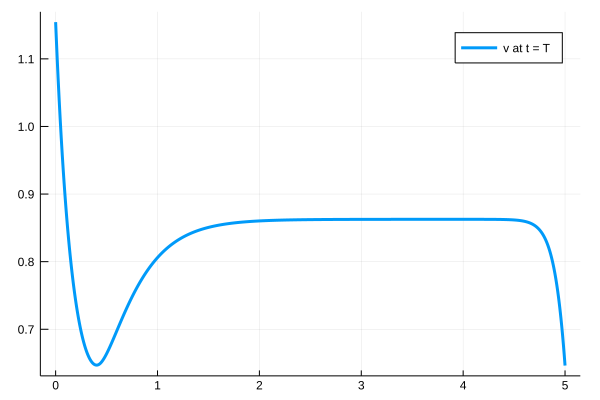

In [26]:
# using Plots
solved = entry_residuals_tuple.solved_dynamics

v0 = map(v -> v[1], solved.v)
v_hat_t0 = map(z -> exp((σ-1)*z), z_grid) .* solved.v[1]







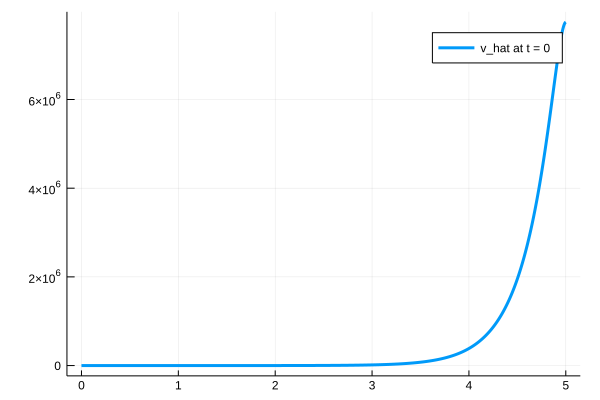

In [34]:
plot(z_grid, v_hat_t0, label = "v_hat at t = 0", lw = 3)

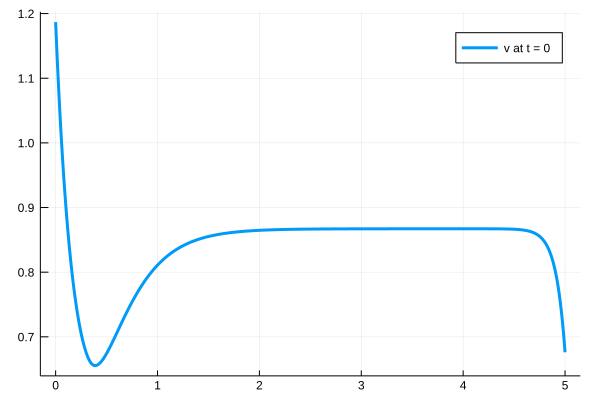

In [35]:
plot(z_grid, solved.v[1], label = "v at t = 0", lw = 3)

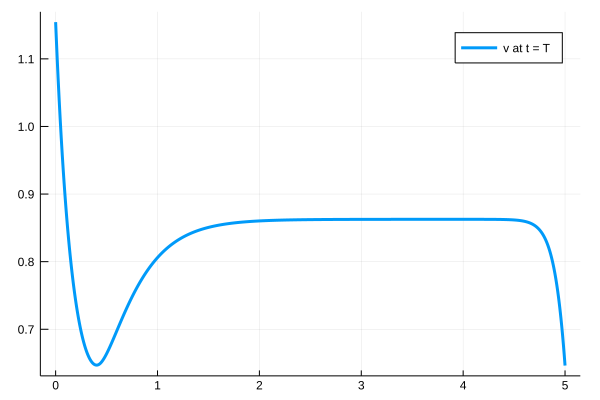

In [36]:
plot(z_grid, solved.v[end], label = "v at t = T", lw = 3)

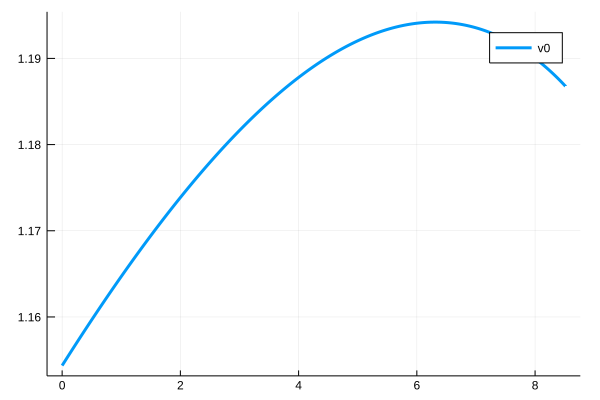

In [27]:
plot(solved.t, v0, label = "v0", lw = 3)

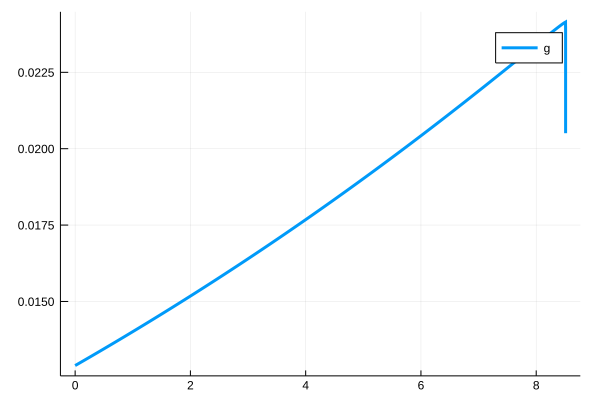

In [28]:
plot(solved.t, solved.g, label = "g", lw = 3)

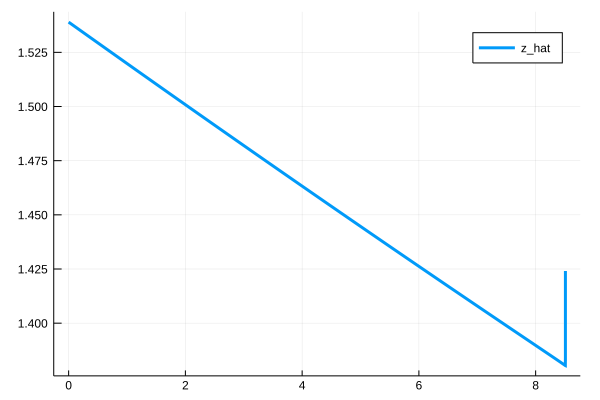

In [37]:
plot(solved.t, solved.z_hat, label = "z_hat", lw = 3)

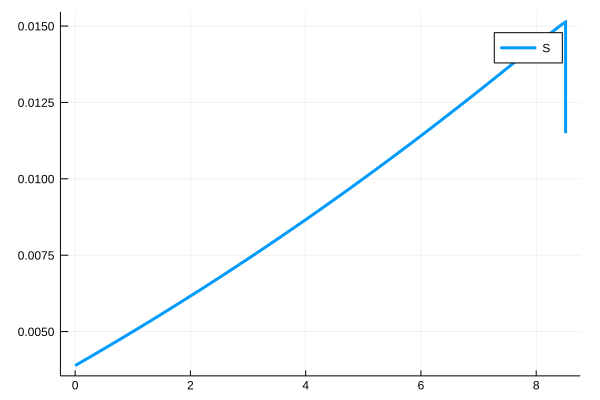

In [38]:
plot(solved.t, solved.S, label = "S", lw = 3)

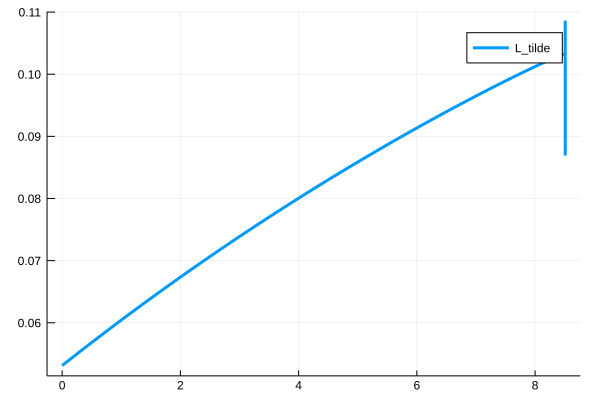

In [39]:
plot(solved.t, solved.L_tilde, label = "L_tilde", lw = 3)

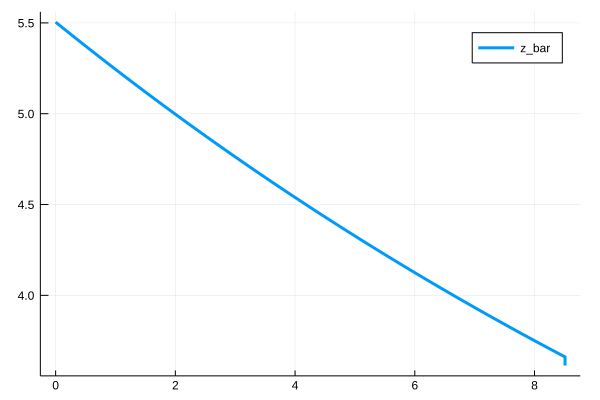

In [40]:
plot(solved.t, solved.z_bar, label = "z_bar", lw = 3)

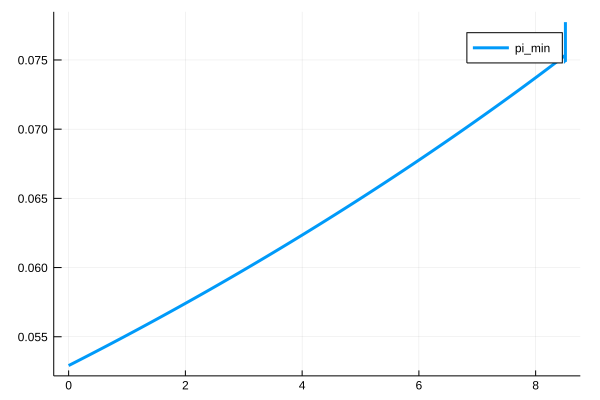

In [41]:
plot(solved.t, solved.π_min, label = "pi_min", lw = 3)

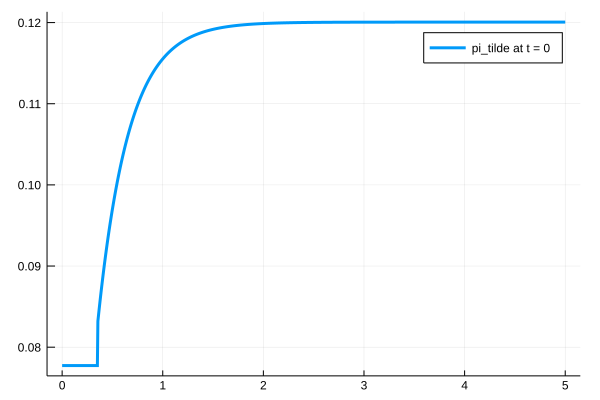

In [42]:
plot(z_grid, solved.π_tilde[1], label = "pi_tilde at t = 0", lw = 3)

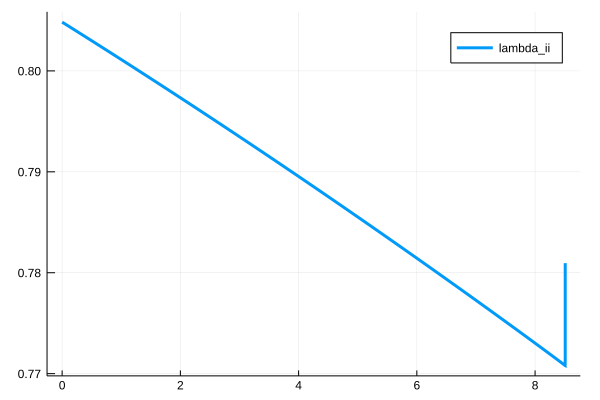

In [29]:
plot(solved.t, solved.λ_ii, label = "lambda_ii", lw = 3)

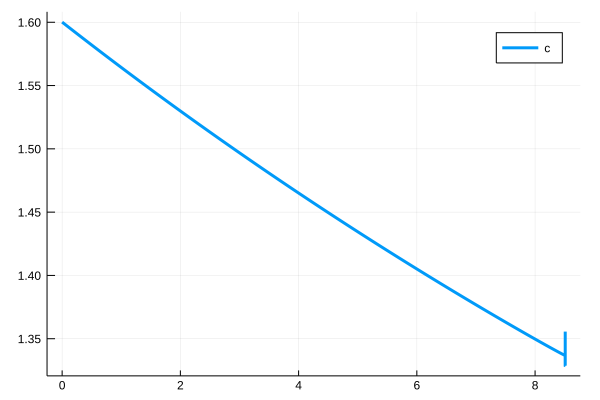

In [33]:
plot(solved.t, solved.c, label = "c", lw = 3)

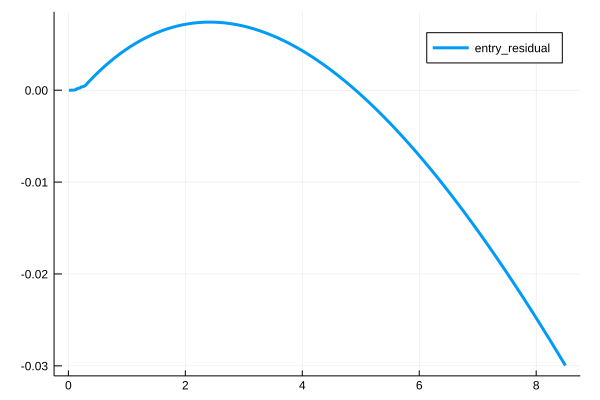

In [32]:
plot(entry_residual_nodes, entry_residuals_tuple.entry_residuals, label = "entry_residual", lw = 3)